In [2]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
pd.set_option('display.max_columns', None)
import os
import calendar
from datetime import datetime
from scipy import stats
from matplotlib import pyplot as plt
import sys
import importlib

In [81]:
importlib.reload(sys.modules['utils.data_proc_utils'])
importlib.reload(sys.modules['utils.analysis_utils'])

<module 'utils.analysis_utils' from 'c:\\Users\\matth\\air_bnb_project\\utils\\analysis_utils.py'>

In [82]:
from utils.data_proc_utils import get_files, proc_calendar, listing_proc, listing_proc2

In [83]:
from utils.analysis_utils import identify_outliers, check_missing, check_missing_dict

In [8]:
all_data = get_files()

In [9]:
calendar_df, listings_df, reviews_df = all_data['calendar.csv'], all_data['listings.csv'], all_data['reviews.csv']

### Explore the calendar file 

In [10]:
process_calendar = proc_calendar(calendar_df)

In [22]:
process_calendar.head()

,listing_id,date,available,price,month,day_of_week
365,3075044,2017-08-22,True,65.0,8,Tuesday
366,3075044,2017-08-21,True,65.0,8,Monday
367,3075044,2017-08-20,True,65.0,8,Sunday
368,3075044,2017-08-19,True,75.0,8,Saturday
369,3075044,2017-08-18,True,75.0,8,Friday


In [11]:
location_map = pd.Series(listings_df.neighbourhood_cleansed.values, index=listings_df.id.values).to_dict()
process_calendar['location'] = process_calendar['listing_id'].map(location_map)

In [25]:
process_calendar.head(10)

,listing_id,date,available,price,month,day_of_week,location
365,3075044,2017-08-22,True,65.0,8,Tuesday,Roslindale
366,3075044,2017-08-21,True,65.0,8,Monday,Roslindale
367,3075044,2017-08-20,True,65.0,8,Sunday,Roslindale
368,3075044,2017-08-19,True,75.0,8,Saturday,Roslindale
369,3075044,2017-08-18,True,75.0,8,Friday,Roslindale
370,3075044,2017-08-17,True,65.0,8,Thursday,Roslindale
371,3075044,2017-08-16,True,65.0,8,Wednesday,Roslindale
372,3075044,2017-08-15,True,65.0,8,Tuesday,Roslindale
373,3075044,2017-08-14,True,65.0,8,Monday,Roslindale
374,3075044,2017-08-13,True,65.0,8,Sunday,Roslindale


In [26]:
process_calendar.groupby('day_of_week')['price'].mean()

day_of_week
Friday       203.121167
Monday       195.809561
Saturday     203.408387
Sunday       198.219764
Thursday     198.073112
Tuesday      195.173842
Wednesday    195.418228
Name: price, dtype: float64

In [27]:
process_calendar.groupby('day_of_week')['price'].apply(lambda x: stats.trim_mean(x, 0.05))

day_of_week
Friday       183.536679
Monday       177.392110
Saturday     183.828860
Sunday       179.240203
Thursday     179.276991
Tuesday      176.931964
Wednesday    177.506861
Name: price, dtype: float64

In [29]:
process_calendar.groupby('month')['price'].apply(lambda x: stats.trim_mean(x, 0.05))

month
1     168.083253
2     165.304264
3     164.733162
4     175.596921
5     173.724689
6     176.695548
7     179.227060
8     177.869893
9     221.001364
10    218.974275
11    187.590208
12    177.188510
Name: price, dtype: float64

In [40]:
process_calendar.groupby('location')['price'].apply(lambda x: stats.trim_mean(x, 0.05)).sort_values(ascending=False)

location
Leather District           341.753446
Chinatown                  312.615424
South Boston Waterfront    308.825098
Bay Village                306.766085
West End                   304.890319
Back Bay                   271.565571
Downtown                   262.152601
Fenway                     251.859354
Beacon Hill                226.036810
North End                  214.441926
South End                  211.754423
South Boston               194.174544
Charlestown                177.986055
Roxbury                    143.019752
Mission Hill               141.735509
Jamaica Plain              139.846170
East Boston                131.784698
Brighton                   119.059293
Longwood Medical Area      109.554534
Allston                    108.157719
West Roxbury               105.932022
Roslindale                  89.051366
Dorchester                  80.923518
Mattapan                    73.291446
Hyde Park                   63.558140
Name: price, dtype: float64

In [51]:
listings_df['property_type'].value_counts()

Apartment          2612
House               562
Condominium         231
Townhouse            54
Bed & Breakfast      41
Loft                 39
Other                17
Boat                 12
Villa                 6
Entire Floor          4
Dorm                  2
Guesthouse            1
Camper/RV             1
Name: property_type, dtype: int64

In [84]:
processed_list = listing_proc(listings_df)

In [85]:
processed_list.describe()

,id,scrape_id,host_id,host_response_rate,host_acceptance_rate,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,security_deposit,cleaning_fee,guests_included,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,reviews_per_month,verification_types,number_of_amenities,host_tenure_days,name_length,description_length,neighbourhood_overview_length,host_about_length,cleaning_fee_flag,security_deposit_flag
count,3.585000e+03,3.585000e+03,3.585000e+03,3114.000000,3114.000000,3585.000000,3585.000000,3585.000000,3585.000000,3585.000000,3571.000000,3575.000000,3576.000000,3585.000000,3585.000000,3585.000000,3585.000000,3585.000000,3.585000e+03,3585.00000,3585.000000,3585.000000,3585.000000,3585.000000,2772.000000,2762.000000,2767.000000,2765.000000,2767.000000,2763.000000,2764.000000,3585.000000,2829.000000,3585.000000,3585.000000,3585.000000,3585.000000,3585.000000,3585.000000,3585.000000,3585.000000,3585.000000
mean,8.440875e+06,2.016091e+13,2.492311e+07,94.989082,84.173089,58.902371,58.902371,42.340032,-71.084818,3.041283,1.221647,1.255944,1.609060,173.925802,121.546722,47.265272,1.429847,3.171269,2.872584e+04,8.64993,21.833194,38.558159,179.346444,19.044630,91.916667,9.431571,9.258041,9.646293,9.646549,9.414043,9.168234,12.733891,1.970908,38.115481,15.862762,2455.668340,32.369596,768.667782,221.449651,295.625105,0.691213,0.374338
std,4.500787e+06,0.000000e+00,2.292781e+07,12.517686,21.779254,171.119663,171.119663,0.024403,0.031565,1.778929,0.501487,0.753060,1.011745,148.331321,255.279878,53.075020,1.056787,8.874133,1.670136e+06,10.43533,21.860966,33.158272,142.136180,35.571658,9.531686,0.931863,1.168977,0.762753,0.735507,0.903436,1.011116,29.415076,2.120561,10.204825,4.832590,620.783376,7.543203,322.449228,267.010687,437.859454,0.462057,0.484019
min,3.353000e+03,2.016091e+13,4.240000e+03,0.000000,0.000000,0.000000,0.000000,42.235942,-71.171789,1.000000,0.000000,0.000000,0.000000,10.000000,0.000000,0.000000,0.000000,1.000000,1.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000,20.000000,2.000000,2.000000,2.000000,4.000000,2.000000,2.000000,1.000000,0.010000,2.000000,1.000000,1562.000000,2.000000,5.000000,1.000000,1.000000,0.000000,0.000000
25%,4.679319e+06,2.016091e+13,6.103425e+06,97.000000,71.000000,1.000000,1.000000,42.329995,-71.105083,2.000000,1.000000,1.000000,1.000000,85.000000,0.000000,0.000000,1.000000,1.000000,3.650000e+02,0.00000,0.000000,0.000000,19.000000,1.000000,89.000000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,1.000000,0.480000,35.000000,13.000000,2004.000000,29.000000,467.000000,3.000000,3.000000,0.000000,0.000000
50%,8.577620e+06,2.016091e+13,1.928100e+07,100.000000,94.000000,2.000000,2.000000,42.345201,-71.078429,2.000000,1.000000,1.000000,1.000000,150.000000,0.000000,30.000000,1.000000,2.000000,1.125000e+03,4.00000,16.000000,37.000000,179.000000,5.000000,94.000000,10.000000,10.000000,10.000000,10.000000,10.000000,9.000000,2.000000,1.170000,38.000000,16.000000,2326.000000,33.000000,1000.000000,133.000000,134.000000,1.000000,0.000000
75%,1.278953e+07,2.016091e+13,3.622147e+07,100.000000,100.000000,7.000000,7.000000,42.354685,-71.062155,4.000000,1.000000,2.000000,2.000000,220.000000,179.000000,80.000000,1.000000,3.000000,1.125000e+03,15.00000,40.000000,68.000000,325.000000,21.000000,98.250000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,6.000000,2.720000,41.000000,19.000000,2791.000000,35.000000,1000.000000,346.000000,427.000000,1.000000,1.000000
max,1.493346e+07,2.016091e+13,9.385411e+07,100.000000,100.000000,749.000000,749.000000,42.389982,-71.000100,16.000000,6.000000,5.000000,16.000000,4000.000000,4500.000000,300.000000,14.000000,300.000000,1.000000e+08,30.00000,60.000000,90

In [86]:
processed_list.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3585 entries, 0 to 3584
Data columns (total 100 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id                                3585 non-null   int64  
 1   listing_url                       3585 non-null   object 
 2   scrape_id                         3585 non-null   int64  
 3   last_scraped                      3585 non-null   object 
 4   name                              3585 non-null   object 
 5   summary                           3442 non-null   object 
 6   space                             2528 non-null   object 
 7   description                       3585 non-null   object 
 8   experiences_offered               3585 non-null   object 
 9   neighborhood_overview             2170 non-null   object 
 10  notes                             1610 non-null   object 
 11  transit                           2295 non-null   object 
 12  acces

In [56]:
processed_list.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,verification_types,number_of_amenities,host_tenure_days,name_length,description_length,neighbourhood_overview_length,host_about_length
0,12147973,https://www.airbnb.com/rooms/12147973,20160906204935,2016-09-07,Sunny Bungalow in the City,"Cozy, sunny, family home. Master bedroom high...",The house has an open and cozy feel at the sam...,"Cozy, sunny, family home. Master bedroom high...",none,"Roslindale is quiet, convenient and friendly. ...",NaN,"The bus stop is 2 blocks away, and frequent. B...","You will have access to 2 bedrooms, a living r...",NaN,Clean up and treat the home the way you'd like...,https://a2.muscache.com/im/pictures/c0842db1-e...,https://a2.muscache.com/im/pictures/c0842db1-e...,https://a2.muscache.com/im/pictures/c0842db1-e...,https://a2.muscache.com/im/pictures/c0842db1-e...,31303940,https://www.airbnb.com/users/show/31303940,Virginia,2015-04-15,"Boston, Massachusetts, United States",We are country and city connecting in our deck...,NaN,NaN,NaN,f,https://a2.muscache.com/im/pictures/5936fef0-b...,https://a2.muscache.com/im/pictures/5936fef0-b...,Roslindale,1,1,"['email', 'phone', 'facebook', 'reviews']",t,f,"Birch Street, Boston, MA 02131, United States",Roslindale,Roslindale,Boston,MA,02131,Boston,"Boston, MA",US,United States,42.282619,-71.133068,t,House,Entire home/apt,4,1.5,2.0,3.0,Real Bed,"{TV,""Wireless Internet"",Kitchen,""Free Parking ...",250.0,NaN,NaN,NaN,$35.00,1,$0.00,2,1125,2 weeks ago,0,0,0,0,2016-09-06,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,f,moderate,f,f,1,NaN,41,15,2072,26,1000,397,180
1,3075044,https://www.airbnb.com/rooms/3075044,20160906204935,2016-09-07,Charming room in pet friendly apt,Charming and quiet room in a second floor 1910...,Small but cozy and quite room with a full size...,Charming and quiet room in a second floor 1910...,none,"The room is in Roslindale, a diverse and prima...","If you don't have a US cell phone, you can tex...",Plenty of safe street parking. Bus stops a few...,Apt has one more bedroom (which I use) and lar...,"If I am at home, I am likely working in my hom...",Pet friendly but please confirm with me if the...,https://a1.muscache.com/im/pictures/39327812/d...,https://a1.muscache.com/im/pictures/39327812/d...,https://a1.muscache.com/im/pictures/39327812/d...,https://a1.muscache.com/im/pictures/39327812/d...,2572247,https://www.airbnb.com/users/show/2572247,Andrea,2012-06-07,"Boston, Massachusetts, United States",I live in Boston and I like to travel and have...,within an hour,100.0,100.0,f,https://a2.muscache.com/im/users/2572247/profi...,https://a2.muscache.com/im/users/2572247/profi...,Roslindale,1,1,"['email', 'phone', 'facebook', 'linkedin', 'a

In [20]:
processed_list.groupby(['neighbourhood_cleansed'])['price'].agg(['mean', 'count']).sort_values(ascending=False, by ='mean')

,mean,count
neighbourhood_cleansed,,
South Boston Waterfront,306.060241,83
Bay Village,266.833333,24
Leather District,253.600000,5
Back Bay,240.950331,302
Downtown,236.459302,172
Chinatown,232.352113,71
Beacon Hill,224.443299,194
Fenway,220.393103,290
West End,209.591837,49


In [33]:
processed_list.groupby(['neighbourhood_cleansed'])['review_scores_rating'].agg(['mean', 'count', 'std']).sort_values(ascending=False, by ='mean')

,mean,count,std
neighbourhood_cleansed,,,
Leather District,98.333333,3,2.886751
Roslindale,95.380000,50,4.619789
West Roxbury,95.212121,33,6.665009
South Boston Waterfront,94.431034,58,7.858646
Jamaica Plain,94.159322,295,7.771724
Longwood Medical Area,94.000000,3,5.291503
South Boston,93.980392,153,6.676225
North End,93.725000,120,6.137038
Charlestown,93.697368,76,8.924901


In [34]:
processed_list.groupby(['neighbourhood_cleansed'])['number_of_reviews'].agg(['mean', 'count', 'std']).sort_values(ascending=False, by ='mean')

,mean,count,std
neighbourhood_cleansed,,,
Longwood Medical Area,43.666667,9,66.796332
East Boston,36.693333,150,57.316611
North End,31.349650,143,53.262869
Dorchester,27.494424,269,49.192253
Jamaica Plain,26.399417,343,41.749331
Roxbury,26.215278,144,35.727634
Roslindale,24.767857,56,29.403767
South Boston,22.132184,174,30.785474
Beacon Hill,21.123711,194,34.008611


In [38]:
processed_list.groupby(['host_name'])['host_listings_count'].agg(['mean', 'count', 'std']).sort_values(ascending=False, by ='mean')

,mean,count,std
host_name,,,
Kara,738.159420,138,89.719372
Seamless,558.000000,79,0.000000
Flatbook,363.000000,58,0.000000
Stay Alfred,307.000000,25,0.000000
Mike,269.056338,71,109.305324
...,...,...,...
Jenna,1.000000,2,0.000000
Jenni,1.000000,1,NaN
颖达,1.000000,1,NaN


In [36]:
processed_list.groupby(['host_name'])['review_scores_rating'].agg(['mean', 'count', 'std']).sort_values(ascending=False, by ='mean')

,mean,count,std
host_name,,,
颖达,100.0,1,NaN
Jerry And Kamil,100.0,1,NaN
Jwon,100.0,1,NaN
Julie Lou,100.0,1,NaN
JuJu,100.0,1,NaN
...,...,...,...
Yisha,NaN,0,NaN
Zhenyang,NaN,0,NaN
Zulma,NaN,0,NaN


<AxesSubplot:xlabel='longitude', ylabel='latitude'>

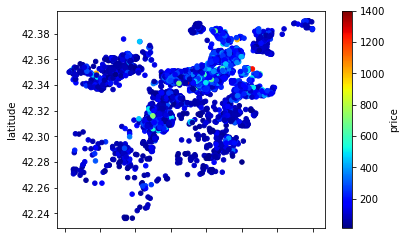

In [65]:
processed_list[processed_list['price'] < 1500].plot.scatter(x = 'longitude', y = 'latitude', c = 'price', colormap='jet')

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

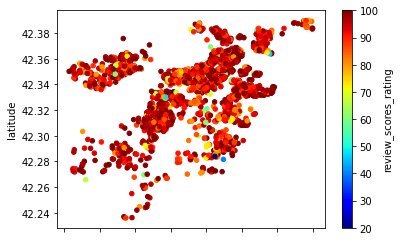

In [76]:
processed_list.plot.scatter(x = 'longitude', y = 'latitude', c = 'review_scores_rating', colormap='jet')

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

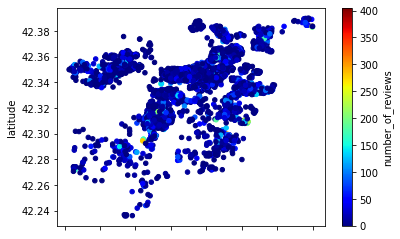

In [77]:
processed_list.plot.scatter(x = 'longitude', y = 'latitude', c = 'number_of_reviews', colormap='jet')

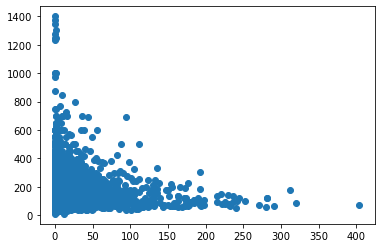

In [74]:
plt.scatter(processed_list['number_of_reviews'][processed_list['price']<1500], processed_list['price'][processed_list['price']<1500])

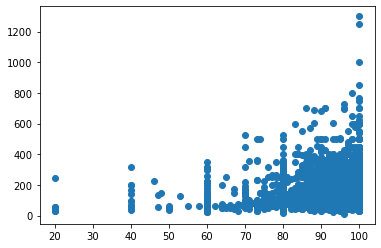

In [15]:
plt.scatter(processed_list['review_scores_rating'][processed_list['price']<1500], processed_list['price'][processed_list['price']<1500])

In [89]:
processed_list.groupby('review_bucket')['price'].mean()

review_bucket
bad             106.259259
good            168.901425
satisfactory    138.804054
Name: price, dtype: float64

In [90]:
check_missing_dict(processed_list, 0.01)

{'summary': 0.03989,
 'space': 0.29484,
 'neighborhood_overview': 0.3947,
 'notes': 0.55091,
 'transit': 0.35983,
 'access': 0.41534,
 'interaction': 0.43347,
 'house_rules': 0.3325,
 'thumbnail_url': 0.16709,
 'medium_url': 0.16709,
 'xl_picture_url': 0.16709,
 'host_about': 0.36513,
 'host_response_time': 0.13138,
 'host_response_rate': 0.13138,
 'host_acceptance_rate': 0.13138,
 'host_neighbourhood': 0.09456,
 'neighbourhood': 0.15146,
 'zipcode': 0.0106,
 'weekly_price': 0.75119,
 'monthly_price': 0.7523,
 'security_deposit': 0.62566,
 'cleaning_fee': 0.30879,
 'first_review': 0.21088,
 'last_review': 0.21088,
 'review_scores_rating': 0.22678,
 'review_scores_accuracy': 0.22957,
 'review_scores_cleanliness': 0.22817,
 'review_scores_checkin': 0.22873,
 'review_scores_communication': 0.22817,
 'review_scores_location': 0.22929,
 'review_scores_value': 0.22901,
 'reviews_per_month': 0.21088,
 'review_bucket': 0.22678}

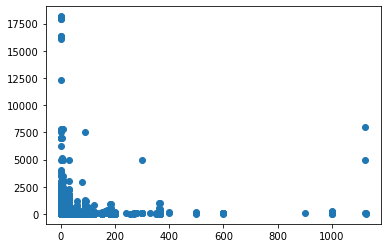

In [43]:
plt.scatter(processed_list['minimum_nights'], processed_list['price'])

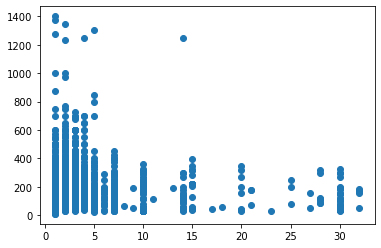

In [47]:
filt_price_and_nights = (processed_list['price'] < 1500) & (processed_list['minimum_nights'] < 50)
plt.scatter(processed_list['minimum_nights'][filt_price_and_nights], processed_list['price'][filt_price_and_nights])

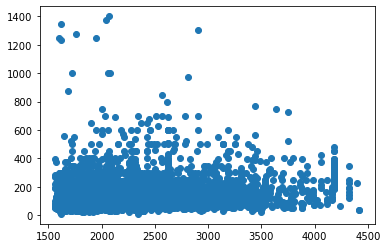

In [22]:
plt.scatter(processed_list['host_tenure_days'][processed_list['price']<1500], processed_list['price'][processed_list['price']<1500])

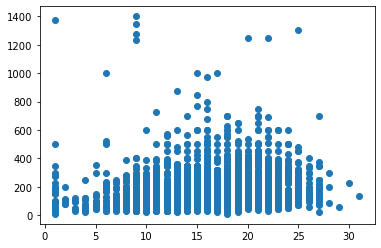

In [23]:
plt.scatter(processed_list['number_of_amenities'][processed_list['price']<1500], processed_list['price'][processed_list['price']<1500])

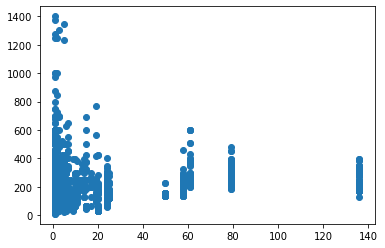

In [25]:
plt.scatter(processed_list['calculated_host_listings_count'][processed_list['price']<1500], processed_list['price'][processed_list['price']<1500])

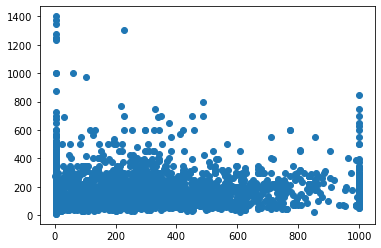

In [48]:
plt.scatter(processed_list['neighbourhood_overview_length'][processed_list['price']<1500], processed_list['price'][processed_list['price']<1500])

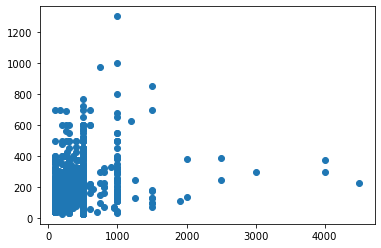

In [61]:
plt.scatter(processed_list['security_deposit'][processed_list['price']<1500], processed_list['price'][processed_list['price']<1500])

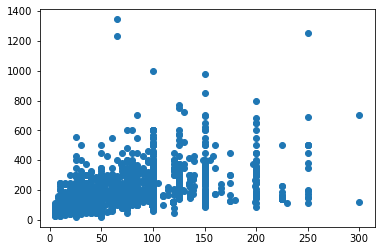

In [62]:
plt.scatter(processed_list['cleaning_fee'][processed_list['price']<1500], processed_list['price'][processed_list['price']<1500])

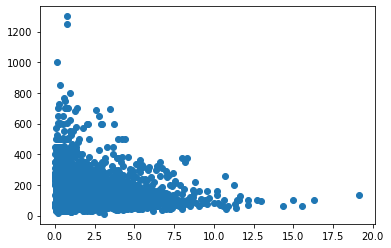

In [50]:
plt.scatter(processed_list['reviews_per_month'][processed_list['price']<1500], processed_list['price'][processed_list['price']<1500])

In [26]:
processed_list.groupby('host_is_superhost')['price'].mean()

host_is_superhost
f    173.604468
t    176.434889
Name: price, dtype: float64

In [30]:
processed_list.groupby('host_identity_verified')['price'].mean()

host_identity_verified
f    173.428717
t    174.113331
Name: price, dtype: float64

In [49]:
processed_list.groupby('room_type')['price'].mean() 

room_type
Entire home/apt    227.436765
Private room        96.041364
Shared room         92.762500
Name: price, dtype: float64

In [55]:
processed_list.groupby('guests_included')['price'].mean()

guests_included
0     133.136364
1     164.494054
2     168.536101
3     216.802198
4     262.727811
5     304.392857
6     334.135135
7     700.000000
8     351.833333
9     480.000000
10    450.000000
12    536.000000
14    310.000000
Name: price, dtype: float64

In [87]:
processed_list.groupby('cleaning_fee_flag')['price'].mean()

cleaning_fee_flag
0    160.862692
1    179.761501
Name: price, dtype: float64

In [88]:
processed_list.groupby('security_deposit_flag')['price'].mean()

security_deposit_flag
0    168.171199
1    183.543964
Name: price, dtype: float64